In [1]:
import pandas as pd
import numpy as np
import glob
import os
import scipy.io as scio
import matplotlib.pyplot as plt
import seaborn as sns
import spectrapepper as spep

from spectra_processing import *
from sklearn.covariance import EllipticEnvelope
from sklearn.cluster import DBSCAN
from BaselineRemoval import *
from processing import *

from mpl_toolkits.mplot3d import Axes3D
from scipy.signal import savgol_filter
from sklearn.decomposition import PCA as PCA
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline as pipe
from sklearn import svm
from sklearn.cluster import KMeans

In [2]:
FTIR_train=pd.read_csv('数据集/FTIR_rabbit_train_ave_mean center.csv',index_col=0)
FTIR_test=pd.read_csv('数据集/FTIR_rabbit_test_ave_mean center.csv',index_col=0)
FTIR_wavenum=np.array(FTIR_train.columns.tolist()[7:],dtype='float')
FTIR_datatrain=FTIR_train.iloc[:,7:]

Raman_train=pd.read_csv('数据集/Raman_rabbit_train_ave_mean center.csv',index_col=0)
Raman_test=pd.read_csv('数据集/Raman_rabbit_test_ave_mean center.csv',index_col=0)
Raman_wavenum=np.array(Raman_train.columns.tolist()[7:],dtype='float')
Raman_datatrain=Raman_train.iloc[:,7:]

Combine_train=pd.concat([FTIR_train,Raman_train.iloc[:,7:]],axis=1)
Combine_test=pd.concat([FTIR_test,Raman_test.iloc[:,7:]],axis=1)
Combine_wavenum=np.array(Combine_train.columns.tolist()[7:],dtype='float')
Combine_datatrain=Combine_train.iloc[:,7:]

In [3]:
(Raman_train['label_2']==FTIR_train['label2']).sum()

336

In [4]:
Combine_train

,label_all,label1,label2,label3,label4,label5,label6,1801.0631656572405,1797.2064993496233,1793.3498330420061,...,311.774414,310.482422,309.189453,307.895508,306.602539,305.308594,304.014648,302.719727,301.424805,300.129883
0,Q-15-0-1-1-1.0,Q,15,0,1,1,QS,-0.001166,0.001674,0.001439,...,-0.003545,-0.005860,-0.000263,0.005652,0.011404,0.016507,0.020480,0.022839,0.023101,0.020784
1,Q-15-0-1-2-1.0,Q,15,0,1,2,QS,0.004235,0.008668,0.008192,...,0.007863,0.018203,0.020235,0.021540,0.021831,0.020818,0.018213,0.013727,0.007072,-0.002041
2,Q-15-0-1-3-1.0,Q,15,0,1,3,QS,0.003849,0.002110,0.001932,...,-0.005026,-0.006678,-0.009187,-0.011444,-0.013339,-0.014765,-0.015612,-0.015772,-0.015137,-0.013597
3,Q-15-0-1-4-1.0,Q,15,0,1,4,QS,0.001841,0.004204,0.003825,...,0.017770,0.015205,0.009088,0.003747,-0.000151,-0.001936,-0.000940,0.003506,0.012072,0.025425
4,Q-15-0-1-5-1.0,Q,15,0,1,5,QS,-0.003703,0.000257,-0.000362,...,0.030552,0.031087,0.025655,0.019371,0.012660,0.005943,-0.000355,-0.005812,-0.010005,-0.012511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,S-90-5-1-4-1.0,S,90,5,1,4,S,0.010624,0.006727,0.006634,...,-0.016082,-0.018935,-0.018544,-0.016183,-0.011517,-0.004212,0.006067,0.019656,0.036890,0.058103
332,S-90-5-1-5-1.0,S,90,5,1,5,S,0.002476,-0.001758,-0.001489,...,0.005651,-0.001091,0.000364,0.002399,0.004633,0.006685,0.008175,0.008721,0.007943,0.005460
333,S-90-5-1-6-1.0,S,90,5,1,6,S,-0.000040,-0.004407,-0.003933,...,-0.087779,-0.095870,-0.106918,-0.117592,-0.127381,-0.135771,-0.142251,-0.146309,-0.147431,-0.145106
334,S-90-5-1-7-1.0,S,90,5,1,7,S,0.004400,0.001065,0.001303,...,-0.018608,-0.014623,-0.013903,-0.014003,-0.015325,-0.018271,-0.023243,-0.030644,-0.040877,-0.054343


# 方差累计图


In [5]:
dataall=[FTIR_datatrain,Raman_datatrain,Combine_datatrain]


loading=[] #载荷图
PC=[]  #主成分得分
exp_var=[] ##主成分解释的方差
for i in dataall:
    pca_=PCA(n_components=20,random_state=225).fit(i)
    pca=pca_.transform(i)
    PC.append(pca)
    loading.append(pca_.components_)
    exp_var.append(pca_.explained_variance_ratio_)

In [6]:
loading[0].shape


(20, 261)

In [7]:
exp_var

[array([0.30738791, 0.26041697, 0.18099888, 0.09103754, 0.04881721,
        0.03861286, 0.02026346, 0.01287735, 0.01162549, 0.00782619,
        0.00440142, 0.00401527, 0.00253557, 0.00190084, 0.00146475,
        0.00127391, 0.00072752, 0.00060859, 0.00055984, 0.00050002]),
 array([0.38900014, 0.19031379, 0.10617267, 0.08853497, 0.04006384,
        0.0299594 , 0.02558596, 0.01982336, 0.01516841, 0.00937232,
        0.00814881, 0.00718696, 0.00613176, 0.0045893 , 0.00366862,
        0.00309215, 0.00292983, 0.00233693, 0.00200908, 0.00190925]),
 array([0.33550922, 0.17038385, 0.09229386, 0.08465748, 0.04859494,
        0.03748276, 0.0289628 , 0.02751571, 0.02307281, 0.01716615,
        0.01625368, 0.01304916, 0.01159668, 0.00799157, 0.00701484,
        0.00581063, 0.00556142, 0.0038893 , 0.00343205, 0.00311706])]

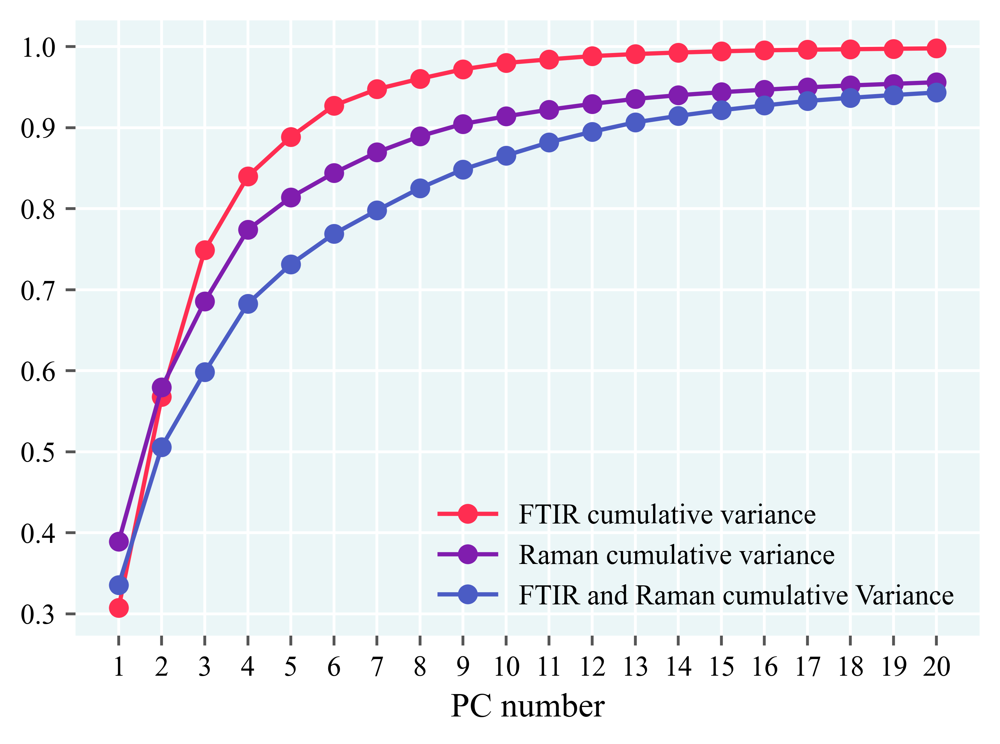

In [8]:
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
from pathlib import Path
from cycler import cycler
import matplotlib.font_manager as fm
# 全局修改rcParams["axes.prop_cycle"]，对所有子图生效
plt.style.use('ggplot')
default_cycler = (cycler(color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) )
plt.rc('axes', prop_cycle=default_cycler,labelcolor='#000000',facecolor='#ebf6f7',linewidth=0)
plt.rc('font',family='Times New Roman',weight='roman',size=10)
font_title=fm.FontProperties(family='Times New Roman',weight='roman',size=12)
font_label=fm.FontProperties(family='Times New Roman',weight='roman',size=12)
color=['#ff2d51','#801dae','#4b5cc4']
label=['FTIR cumulative variance', 'Raman cumulative variance','FTIR and Raman cumulative Variance' ]


fig, ax=plt.subplots(1, 1, figsize=(5, 3.75), dpi=600,tight_layout=True)
for i in [*range(3)]:
    ax.plot(np.arange(1,21),np.cumsum(exp_var[i]),'-o', label=label[i],color=color[i])
ax.set_xlabel("PC number",fontproperties=font_label)
ax.set(xlim=(0, 21), xticks=np.arange(1, 21))
ax.legend(loc='best',frameon=False)
ax.tick_params(axis='both',labelsize=10,labelcolor='#000000',direction='out',width=1,grid_linewidth=1)

#plt.savefig('PCA cumulative Variance.eps',dpi=600,format='eps',bbox_inches='tight')
plt.show()

# PCA 画图

In [9]:
Combine_train

,label_all,label1,label2,label3,label4,label5,label6,1801.0631656572405,1797.2064993496233,1793.3498330420061,...,311.774414,310.482422,309.189453,307.895508,306.602539,305.308594,304.014648,302.719727,301.424805,300.129883
0,Q-15-0-1-1-1.0,Q,15,0,1,1,QS,-0.001166,0.001674,0.001439,...,-0.003545,-0.005860,-0.000263,0.005652,0.011404,0.016507,0.020480,0.022839,0.023101,0.020784
1,Q-15-0-1-2-1.0,Q,15,0,1,2,QS,0.004235,0.008668,0.008192,...,0.007863,0.018203,0.020235,0.021540,0.021831,0.020818,0.018213,0.013727,0.007072,-0.002041
2,Q-15-0-1-3-1.0,Q,15,0,1,3,QS,0.003849,0.002110,0.001932,...,-0.005026,-0.006678,-0.009187,-0.011444,-0.013339,-0.014765,-0.015612,-0.015772,-0.015137,-0.013597
3,Q-15-0-1-4-1.0,Q,15,0,1,4,QS,0.001841,0.004204,0.003825,...,0.017770,0.015205,0.009088,0.003747,-0.000151,-0.001936,-0.000940,0.003506,0.012072,0.025425
4,Q-15-0-1-5-1.0,Q,15,0,1,5,QS,-0.003703,0.000257,-0.000362,...,0.030552,0.031087,0.025655,0.019371,0.012660,0.005943,-0.000355,-0.005812,-0.010005,-0.012511
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331,S-90-5-1-4-1.0,S,90,5,1,4,S,0.010624,0.006727,0.006634,...,-0.016082,-0.018935,-0.018544,-0.016183,-0.011517,-0.004212,0.006067,0.019656,0.036890,0.058103
332,S-90-5-1-5-1.0,S,90,5,1,5,S,0.002476,-0.001758,-0.001489,...,0.005651,-0.001091,0.000364,0.002399,0.004633,0.006685,0.008175,0.008721,0.007943,0.005460
333,S-90-5-1-6-1.0,S,90,5,1,6,S,-0.000040,-0.004407,-0.003933,...,-0.087779,-0.095870,-0.106918,-0.117592,-0.127381,-0.135771,-0.142251,-0.146309,-0.147431,-0.145106
334,S-90-5-1-7-1.0,S,90,5,1,7,S,0.004400,0.001065,0.001303,...,-0.018608,-0.014623,-0.013903,-0.014003,-0.015325,-0.018271,-0.023243,-0.030644,-0.040877,-0.054343


In [10]:
label_1=Combine_train['label1']
label_3=Combine_train['label2']
label_6=Combine_train['label6']

label_two= list(set(label_1))
label_two.sort()
label_time=list(set(label_3))
label_time.sort()
label_three=list(set(label_6))
label_three.sort()

In [11]:
label_two

['Q', 'S']

In [12]:
label_three

['Q', 'QS', 'S']

In [13]:
label_time

[2, 5, 15, 30, 60, 90, 180]

In [14]:
PC[0][:,0].shape

(336,)

In [15]:
loading[0].shape

(20, 261)

## FTIR

In [16]:
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
from pathlib import Path
from cycler import cycler
import matplotlib.font_manager as fm
# 全局修改rcParams["axes.prop_cycle"]，对所有子图生效
plt.style.use('ggplot')
default_cycler = (cycler(color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) )
plt.rc('axes', prop_cycle=default_cycler,labelcolor='#000000',facecolor='#ebf6f7',linewidth=0)
plt.rc('font',family='Times New Roman',weight='roman',size=14)
font_title=fm.FontProperties(family='Times New Roman',weight='roman',size=16)
font_label=fm.FontProperties(family='Times New Roman',weight='roman',size=14)
colors_2=['#be002f','#177cb0']
colors_3=['#be002f','#eaff56','#177cb0']
colors_6=['#99c1f9','#709cec','#5176db', '#3d4ec5', '#381faa','#03308d', '#18037a'] 
label_PC=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8']
labels_2=['Antemortem','Postmortem']
labels_3=['Antemortem','Perimortem','Postmortem']
labels_6=['2h', '5d', '15d', '30d', '60d', '90d', '180d']

plt.figure(figsize=(18,12),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.15)

plt.subplot(221)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_two):
    col = colors_2[i]
    xi = [PC[0][j,0] for j in range(len(PC[0][:,0])) if label_1[j] == u]
    yi = [PC[0][j,1] for j in range(len(PC[0][:,1])) if label_1[j] == u]
    plt.scatter(xi, yi, c=col,s=110, edgecolors='k',label=labels_2[i])
plt.xlabel('PC1(30.74%)',fontproperties=font_label)
plt.xlim(-1.5,2.4)
plt.ylabel('PC2(26.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)


plt.subplot(222)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_three):
    col = colors_3[i]
    xi = [PC[0][j,0] for j in range(len(PC[0][:,0])) if label_6[j] == u]
    yi = [PC[0][j,1] for j in range(len(PC[0][:,1])) if label_6[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_3[i])
plt.xlabel('PC1(30.74%)',fontproperties=font_label)
plt.xlim(-1.5,2.4)
plt.ylabel('PC2(26.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)

plt.subplot(223)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_time):
    col = colors_6[i]
    xi = [PC[0][j,0] for j in range(len(PC[0][:,0])) if label_3[j] == u]
    yi = [PC[0][j,1] for j in range(len(PC[0][:,1])) if label_3[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_6[i])
plt.xlabel('PC1(30.74%)',fontproperties=font_label)
plt.xlim(-1.5,2.4)
plt.ylabel('PC2(26.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)



plt.subplot(224)
for i, u in enumerate(loading[0][:2,:]):
    plt.plot(FTIR_wavenum, u, lw=2,label=label_PC[i])
plt.axhline(y=0.0, c="black", ls="--", lw=1.5)
plt.xlabel('Wavenumber ($\mathregular{cm^{-1}}$)',fontproperties=font_label)
plt.ylabel('Loading',fontproperties=font_label)
plt.xlim(800,1800)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='lower right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)

# plt.savefig('FTIR_PCA.eps',dpi=600,format='eps',bbox_inches='tight')
plt.show()

## Raman

In [17]:
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
from pathlib import Path
from cycler import cycler
import matplotlib.font_manager as fm
# 全局修改rcParams["axes.prop_cycle"]，对所有子图生效
plt.style.use('ggplot')
default_cycler = (cycler(color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) )
plt.rc('axes', prop_cycle=default_cycler,labelcolor='#000000',facecolor='#ebf6f7',linewidth=0)
plt.rc('font',family='Times New Roman',weight='roman',size=14)
font_title=fm.FontProperties(family='Times New Roman',weight='roman',size=16)
font_label=fm.FontProperties(family='Times New Roman',weight='roman',size=14)
colors_2=['#be002f','#177cb0']
colors_3=['#be002f','#eaff56','#177cb0']
colors_6=['#99c1f9','#709cec','#5176db', '#3d4ec5', '#381faa','#03308d', '#18037a'] 
label_PC=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8']
labels_2=['Antemortem','Postmortem']
labels_3=['Antemortem','Perimortem','Postmortem']
labels_6=['2h', '5d', '15d', '30d', '60d', '90d', '180d']

plt.figure(figsize=(18,12),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.15)

plt.subplot(221)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_two):
    col = colors_2[i]
    xi = [PC[1][j,0] for j in range(len(PC[1][:,0])) if label_1[j] == u]
    yi = [PC[1][j,1] for j in range(len(PC[1][:,1])) if label_1[j] == u]
    plt.scatter(xi, yi, c=col,s=110, edgecolors='k',label=labels_2[i])
plt.xlabel('PC1(38.90%)',fontproperties=font_label)
plt.ylabel('PC2(19.03%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)


plt.subplot(222)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_three):
    col = colors_3[i]
    xi = [PC[1][j,0] for j in range(len(PC[1][:,0])) if label_6[j] == u]
    yi = [PC[1][j,1] for j in range(len(PC[1][:,1])) if label_6[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_3[i])
plt.xlabel('PC1(38.90%)',fontproperties=font_label)
plt.ylabel('PC2(19.03%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)

plt.subplot(223)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_time):
    col = colors_6[i]
    xi = [PC[1][j,0] for j in range(len(PC[1][:,0])) if label_3[j] == u]
    yi = [PC[1][j,1] for j in range(len(PC[1][:,1])) if label_3[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_6[i])
plt.xlabel('PC1(38.90%)',fontproperties=font_label)
plt.ylabel('PC2(19.03%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)



plt.subplot(224)
for i, u in enumerate(loading[1][:2,:]):
    plt.plot(Raman_wavenum, u, lw=2,label=label_PC[i])
plt.axhline(y=0.0, c="black", ls="--", lw=1.5)
plt.xlabel('Raman Shift ($\mathregular{cm^{-1}}$)',fontproperties=font_label)
plt.ylabel('Loading',fontproperties=font_label)
plt.xlim(300,2000)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='lower right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)

#plt.savefig('Raman_PCA.eps',dpi=600,format='eps',bbox_inches='tight')
plt.show()

In [18]:
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
from pathlib import Path
from cycler import cycler
import matplotlib.font_manager as fm
# 全局修改rcParams["axes.prop_cycle"]，对所有子图生效
plt.style.use('ggplot')
default_cycler = (cycler(color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) )
plt.rc('axes', prop_cycle=default_cycler,labelcolor='#000000',facecolor='#ebf6f7',linewidth=0)
plt.rc('font',family='Times New Roman',weight='roman',size=14)
font_title=fm.FontProperties(family='Times New Roman',weight='roman',size=16)
font_label=fm.FontProperties(family='Times New Roman',weight='roman',size=14)
colors_2=['#be002f','#177cb0']
colors_3=['#be002f','#eaff56','#177cb0']
colors_6=['#99c1f9','#709cec','#5176db', '#3d4ec5', '#381faa','#03308d', '#18037a'] 
label_PC=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8']
labels_2=['Antemortem','Postmortem']
labels_3=['Antemortem','Perimortem','Postmortem']
labels_6=['2h', '5d', '15d', '30d', '60d', '90d', '180d']

plt.figure(figsize=(20,18),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.1)

plt.subplot(321)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_two):
    col = colors_2[i]
    xi = [PC[0][j,0] for j in range(len(PC[0][:,0])) if label_1[j] == u]
    yi = [PC[0][j,1] for j in range(len(PC[0][:,1])) if label_1[j] == u]
    plt.scatter(xi, yi, c=col,s=110, edgecolors='k',label=labels_2[i])
plt.xlabel('PC1(30.74%)',fontproperties=font_label)
plt.xlim(-1.5,2.4)
plt.ylabel('PC2(26.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)


plt.subplot(322)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_two):
    col = colors_2[i]
    xi = [PC[1][j,0] for j in range(len(PC[1][:,0])) if label_1[j] == u]
    yi = [PC[1][j,1] for j in range(len(PC[1][:,1])) if label_1[j] == u]
    plt.scatter(xi, yi, c=col,s=110, edgecolors='k',label=labels_2[i])
plt.xlabel('PC1(38.90%)',fontproperties=font_label)
plt.ylabel('PC2(19.03%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)

plt.subplot(323)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_time):
    col = colors_6[i]
    xi = [PC[0][j,0] for j in range(len(PC[0][:,0])) if label_3[j] == u]
    yi = [PC[0][j,1] for j in range(len(PC[0][:,1])) if label_3[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_6[i])
plt.xlabel('PC1(30.74%)',fontproperties=font_label)
plt.xlim(-1.5,2.4)
plt.ylabel('PC2(26.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)


plt.subplot(324)
plt.axhline(y=0.0, c="black", ls="--", lw=1)
plt.axvline(x=0,c="black", ls="--", lw=1)
for i, u in enumerate(label_time):
    col = colors_6[i]
    xi = [PC[1][j,0] for j in range(len(PC[1][:,0])) if label_3[j] == u]
    yi = [PC[1][j,1] for j in range(len(PC[1][:,1])) if label_3[j] == u]
    plt.scatter(xi, yi, c=col, s=110, edgecolors='k',label=labels_6[i])
plt.xlabel('PC1(38.90%)',fontproperties=font_label)
plt.ylabel('PC2(19.03%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)


plt.subplot(325)
for i, u in enumerate(loading[0][:2,:]):
    plt.plot(FTIR_wavenum, u, lw=2,label=label_PC[i])
plt.axhline(y=0.0, c="black", ls="--", lw=1.5)
plt.xlabel('Wavenumber ($\mathregular{cm^{-1}}$)',fontproperties=font_label)
plt.ylabel('Loading',fontproperties=font_label)
plt.xlim(800,1800)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='lower right',frameon=False)
#plt.title('FTIR PCA',fontproperties=font_title)

plt.subplot(326)
for i, u in enumerate(loading[1][:2,:]):
    plt.plot(Raman_wavenum, u, lw=2,label=label_PC[i])
plt.axhline(y=0.0, c="black", ls="--", lw=1.5)
plt.xlabel('Raman Shift ($\mathregular{cm^{-1}}$)',fontproperties=font_label)
plt.ylabel('Loading',fontproperties=font_label)
plt.xlim(300,2000)
plt.tick_params(axis='both',labelsize=14,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='lower right',frameon=False)
#plt.title('Raman PCA',fontproperties=font_title)

#plt.savefig('PCA.eps',dpi=600,format='eps',bbox_inches='tight')
plt.show()

## Combine

In [19]:
%matplotlib inline
plt.rcParams.update(plt.rcParamsDefault)
from pathlib import Path
from cycler import cycler
import matplotlib.font_manager as fm
# 全局修改rcParams["axes.prop_cycle"]，对所有子图生效
plt.style.use('ggplot')
default_cycler = (cycler(color=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#e377c2', '#7f7f7f', '#bcbd22', '#17becf']) )
plt.rc('axes', prop_cycle=default_cycler,labelcolor='#000000',facecolor='#ebf6f7',linewidth=0)
plt.rc('font',family='Times New Roman',weight='roman',size=12)
font_title=fm.FontProperties(family='Times New Roman',weight='roman',size=16)
font_label=fm.FontProperties(family='Times New Roman',weight='roman',size=14)
colors_2=['#be002f','#177cb0']
colors_3=['#be002f','#eaff56','#177cb0']
colors_6=['#99c1f9','#709cec','#5176db', '#3d4ec5', '#381faa','#03308d', '#18037a'] 
label_PC=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8']
labels_2=['Antemortem','Postmortem']
labels_3=['Antemortem','Perimortem','Postmortem']
labels_6=['2h', '5d', '15d', '30d', '60d', '90d', '180d']

plt.figure(figsize=(21,12),dpi=600)
plt.subplots_adjust(hspace=0.2, wspace=0.1)

plt.subplot(221)
for i, u in enumerate(label_two):
    col = colors_2[i]
    xi = [PC[2][j,0] for j in range(len(PC[2][:,0])) if label_1[j] == u]
    yi = [PC[2][j,1] for j in range(len(PC[2][:,1])) if label_1[j] == u]
    plt.scatter(xi, yi, c=col,s=60, edgecolors='k',label=labels_2[i])
plt.xlabel('PC1(33.35%)',fontproperties=font_label)
plt.ylabel('PC2(17.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=12,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
plt.title('FTIR and Raman PCA',fontproperties=font_title)


plt.subplot(222)
for i, u in enumerate(label_three):
    col = colors_3[i]
    xi = [PC[2][j,0] for j in range(len(PC[2][:,0])) if label_6[j] == u]
    yi = [PC[2][j,1] for j in range(len(PC[2][:,1])) if label_6[j] == u]
    plt.scatter(xi, yi, c=col, s=60, edgecolors='k',label=labels_3[i])
plt.xlabel('PC1(33.35%)',fontproperties=font_label)
plt.ylabel('PC2(17.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=12,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
plt.title('FTIR and Raman PCA',fontproperties=font_title)

plt.subplot(223)
for i, u in enumerate(label_time):
    col = colors_6[i]
    xi = [PC[2][j,0] for j in range(len(PC[2][:,0])) if label_3[j] == u]
    yi = [PC[2][j,1] for j in range(len(PC[2][:,1])) if label_3[j] == u]
    plt.scatter(xi, yi, c=col, s=60, edgecolors='k',label=labels_6[i])
plt.xlabel('PC1(33.35%)',fontproperties=font_label)
plt.ylabel('PC2(17.04%)',fontproperties=font_label)
plt.tick_params(axis='both',labelsize=12,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
plt.title('FTIR and Raman PCA',fontproperties=font_title)



plt.subplot(224)
for i, u in enumerate(loading[2][:2,:261]):
    plt.plot(FTIR_wavenum, u+0.3, lw=2,label='FTIR-'+label_PC[i])
for i, u in enumerate(loading[2][:2,261:]):
    plt.plot(Raman_wavenum, u, lw=2,label='Raman-'+label_PC[i])
plt.axhline(y=0.0, c="black", ls="--", lw=1.5)
plt.axhline(y=0.3, c="black", ls="--", lw=1.5)

plt.xlabel('Wavenumber ($\mathregular{cm^{-1}}$)',fontproperties=font_label)
plt.ylabel('Loading',fontproperties=font_label)
plt.xlim(300,2000)
plt.ylim(-0.3,0.6)
plt.yticks([])
plt.tick_params(axis='both',labelsize=12,labelcolor='#000000',direction='out',width=1.5,grid_linewidth=1.5)
plt.legend(loc='upper right',frameon=False)
plt.title('FTIR and Raman PCA',fontproperties=font_title)

#plt.savefig('图片/Combine_PCA.eps',dpi=600,format='eps',bbox_inches='tight')
plt.show()